# Setup

In [1]:
%matplotlib notebook
from ipywidgets import interactive, fixed, interact
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.animation as animation
import pandas as pd
from importData import importAll
import displayData
from generateTrajectories import generateDiffuseTetherModel
import bayesianTools
from IPython.display import HTML,clear_output
from importlib import reload

# Import or create a dataframe

You can import a dataframe and filter it by experiment or parameters

*Note*: The first import after will include reading from .csv and saving to a binary feather file and might take a few minutes.

In [20]:
df = importAll()
# df["state"]=0

df=df[(df.experiment=="K on K ; s=160")]
# df=df[(df.experiment=="Lab")]

# df = df[df.particle==18049]

N_particles=5
random_particle_id = np.random.choice(df.particle.unique(), size=min(N_particles,len(df.particle.unique())), replace=False)
df = df[df["particle"].isin(random_particle_id)]

# df=df[(df.experiment=="K on K ; s=0")|
#       (df.experiment=="K on K ; s=60")|
#       (df.experiment=="K on K ; s=110")|
#       (df.experiment=="K on K ; s=160")]

# df=df[(df.experiment=="K on K ; s=0")|
#       (df.experiment=="G on G ; s=0")|
#       (df.experiment=="G on G ; s=60")|
#       (df.experiment=="G on G ; s=160")]
#       (df.experiment=="Lab")]

#df = df[(df.particle>=3000) & (df.particle<3100)]
# df_orig=df.copy()

Instead you can create synthetic dataframe:

In [ ]:
dt=0.02
T_end=0.02*(256-1)
N_particle=1
undersample_ratio=0.1
saveFiles=False
init_state=0
forceOneMode=0
T_stick=.4
T_unstick=2.
D=30./4.
A=(0.25)**2
df = generateDiffuseTetherModel(T_stick=T_stick, T_unstick=T_unstick, D=D, A=A, dt=dt, T_end=T_end, N_particle=N_particle, init_state=init_state,undersample_ratio=undersample_ratio, experiment_name=[], salinity_index=1, saveFiles=saveFiles,forceOneMode=forceOneMode)

# Display Some Graphs

In [3]:
df=df_orig[df_orig["particle"]==0]

Animate the trajectories:

In [21]:
max_frame = 200
startAtOrigin=True
doneTrajNoMarker=True
dispLegend=True

fig, ax = plt.subplots(figsize=(5,5))
drawnLines=displayData.plotTrajectories(df, t_end=max_frame, doneTrajNoMarker=doneTrajNoMarker,
                                           startAtOrigin=startAtOrigin,
                                           dispLegend=dispLegend, ax=ax, useDrawnLines=False, drawnLines=[],hideLines=True)
def animateTraj(t_end):
    displayData.notebookAnimateTraj(df,ax,t_end,max_frame,startAtOrigin=startAtOrigin,doneTrajNoMarker=doneTrajNoMarker,dispLegend=dispLegend,useDrawnLines=True,drawnLines=drawnLines)
ani = animation.FuncAnimation(fig, animateTraj, frames=max_frame)
clear_output(wait=True)
HTML(ani.to_jshtml())

In [ ]:
fig, ax = plt.subplots(figsize=(6, 4))
gb = df.groupby("particle")
for particle_id in df.particle.unique():
    particle_df=gb.get_group(particle_id)
    t = particle_df.t.values
    x = particle_df.x.values
    y = particle_df.y.values
    x = x-x[0]
    y = y-y[0]
    ax.plot(t,x)

Plot the MSD:

<IPython.core.display.Javascript object>


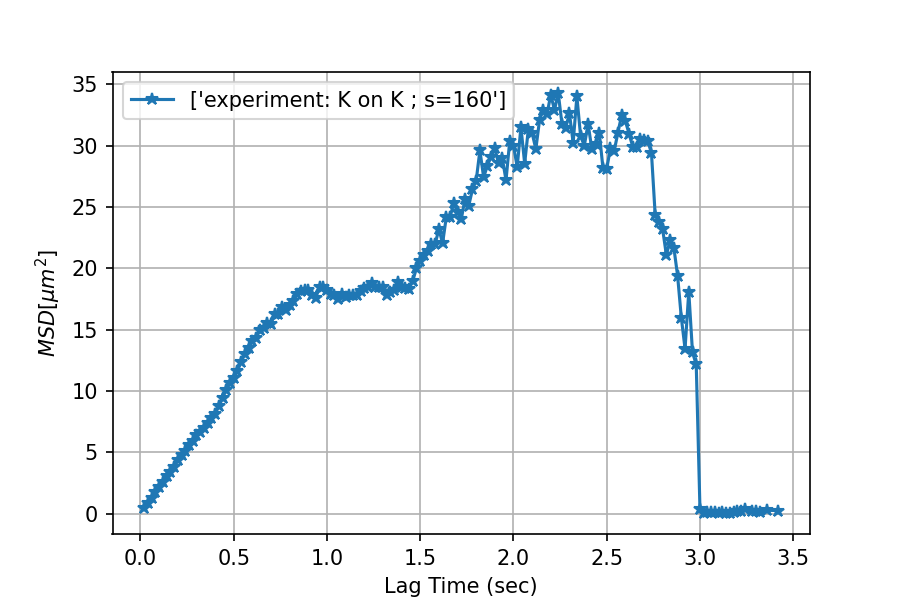

interactive(children=(Dropdown(description='group_by', options=('experiment', 'particle'), value='experiment')…

In [22]:
fig, ax = plt.subplots(figsize=(6, 4))

@interact(Log_Scale=True,group_by=["experiment","particle"],max_lagtime=(100,2000,10),step_lagtime = (1,10,1),equal_weight_per_particle=False)
def update(group_by="experiment",Log_Scale=True,equal_weight_per_particle=True,step_lagtime=5,max_lagtime=1000,):
    ax.cla()
    displayData.plot_MSD(df, lagtime=np.arange(1, max_lagtime, step=step_lagtime), group_by=group_by, logscale=Log_Scale, ax=ax,eqParticleWeight=equal_weight_per_particle)
    ax.grid(True)


Plot the displacement distribution $G(\Delta x,\Delta t)$:

In [ ]:
# set up plot
fig, ax = plt.subplots(figsize=(6, 4))

dt_default = 3
xlim_default = 20.

@interact(dt=(1, min(200,df.frame.max()-1), 1),semiLogScale=True,direction=["xy", "x", "y"],group_by=["experiment","particle"],x_lim=(1., 20., 0.5),equal_weight_per_particle=False)
def update(dt=dt_default,x_lim=xlim_default,semiLogScale=True,equal_weight_per_particle=True,group_by="experiment",direction="xy"):
    #[l.remove() for l in ax.lines]
    ax.cla()
    displayData.plot_G_dx_dt(df, direction=direction, group_by=group_by, dt=dt, return_stats=False,semilogscale=semiLogScale,ax=ax,equal_particle_weight=equal_weight_per_particle)
    ax.set_xlim([-x_lim,x_lim])
    if semiLogScale:
        ax.set_ylim([1e-6,1e1])
    else:
         ax.set_ylim([0,2.])   
    ax.grid(True)

# Bayesian Analysis

In [ ]:
reload(bayesianTools)
plt.close("all")
# T_stick *= 1+ 0.9*(np.random.rand()-0.5)
# T_unstick *= 1+ 0.9*(np.random.rand()-0.5)
# D *= 1+ 0.7*(np.random.rand()-0.5)
# A *= 1+ 0.7*(np.random.rand()-0.5)


trajData = bayesianTools.extract_trajData_from_df(df)
df.loc[df.index[-1],"state"]=0.5
ind = df["state"] == 0.5
ind[0] = True
t_stick_unstick_with_boundary = df.t[ind]
t_stick_unstick = t_stick_unstick_with_boundary[1:-1]

dt_for_jac = 0.02 * np.ones(len(t_stick_unstick))
log_P_k = np.log(bayesianTools.kEventsProb(len(t_stick_unstick), 0, df.t.values.max(), T_stick=T_stick,
                                           T_unstick=T_unstick).astype(
    float) * np.abs(1))  # involve init state prior
true_likelihood = log_P_k + bayesianTools.specificTrajectoryLikelihood(trajData, 0, t_stick_unstick,
                                                                       dt_for_jac, T_stick=T_stick,
                                                                       T_unstick=T_unstick,
                                                                       D=D, A=A)

plt.figure()
plt.subplot(1, 3, 1)
ax = plt.gca()
displayData.plotTrajectories(df, t_end=2000, startAtOrigin=True, doneTrajNoMarker=True, ax=ax)
ax.set_title("True ; L=" + "{:.2f}".format(true_likelihood))
df_unsplit, max_likelihood = bayesianTools.particleLikelihood(df.head(80), T_stick=T_stick, T_unstick=T_unstick, D=D,
                                                                   A=A, mode=1)


N = len(df)
half_N = int(N / 2)
df1, max_likelihood1 = bayesianTools.particleLikelihood(df.head(half_N), T_stick=T_stick, T_unstick=T_unstick,
                                                              D=D, A=A,
                                                              mode=1)
df2, max_likelihood2 = bayesianTools.particleLikelihood(df.tail(half_N), T_stick=T_stick, T_unstick=T_unstick,
                                                              D=D, A=A,
                                                              mode=1)
df_split = df1.append(df2)


plt.subplot(1, 3, 2)
ax = plt.gca()
displayData.plotTrajectories(df_unsplit, t_end=2000, startAtOrigin=True, doneTrajNoMarker=True, ax=ax)
ax.set_title("Unsplit ; L=" + "{:.2f}".format(max_likelihood))
plt.subplot(1, 3, 2)
ax = plt.gca()

plt.subplot(1, 3, 3)
ax = plt.gca()
displayData.plotTrajectories(df_split, t_end=2000, startAtOrigin=True, doneTrajNoMarker=True, ax=ax)
ax.set_title("Split ; L=" + "{:.2f}".format(max_likelihood1 + max_likelihood2))
plt.show(block=False)

plt.figure()
plt.plot(df.frame,df.state,marker='*')
plt.plot(df_unsplit.frame,df_unsplit.state, linestyle="--",marker='*')
plt.plot(df_split.frame,df_split.state, linestyle=":",marker='*')

